<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# Capstone Project
# Automated Car Damage Detection for Insurance Claims

## Business problem
Manual car damage assessment in insurance claims is inefficient, inconsistent, and prone to errors, leading to delays, higher costs, and increased risk of fraud. Automating damage detection with an image classification model can streamline the claims process, improve accuracy, and ensure consistent assessments. This will reduce operational costs, expedite claim settlements, and enhance customer satisfaction by enabling faster, more reliable decision-making.

## Objective
To automatically detect and classify car damage from images using computer vision, enabling faster, more accurate, and consistent insurance claim processing.

## Dataset
The dataset contains approximately 1,500 unique RGB images with the dimensions 224 x 224 pixels., labeled 8 categories. Note that the unknown class contains images of cars that are in either pristine or wrecked condition.

It has the classes:
- bumper_dent
- bumper_scratch
- door_dent
- door_scratch
- glass_shatter
- head_lamp
- tail_lamp
- unknown

## Import libraries

In [ ]:
# Uncomment the statements below if there are problems with TensorFlow on macOS
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

In [ ]:
## Import libraries
import pandas as pd
import numpy as np
import seaborn as sns

%matplotlib inline
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_recall_fscore_support,
)


import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Uncomment the statement below to allow online monitoring with TensorBoard (need to be installed)
from keras.callbacks import TensorBoard

In [ ]:
# import tensorflow and keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2, VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from keras.layers import Conv2D
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import MaxPool2D
from keras.models import Sequential
from keras.utils import to_categorical

In [ ]:
import keras
print(keras.__version__)

3.10.0


In [ ]:
print(tf.__version__)

2.19.0


## Global configuration

In [ ]:
IMG_SIZE        = (224, 224)
INPUT_SHAPE     = IMG_SIZE + (3,)
BATCH_SIZE      = 32
NUM_CLASSES     = 8
EPOCHS          = 100
SEED            = 42

np.random.seed(SEED)
tf.random.set_seed(SEED)
tf.config.experimental.enable_op_determinism()

In [ ]:
classes = (
    'bumper_dent',
    'bumper_scratch',
    'door_dent',
    'door_scratch',
    'glass_shatter',
    'head_lamp',
    'tail_lamp',
    'unknown')

## Load data

In [ ]:
data_csv = "./CarDamage/data.csv"
data = pd.read_csv(data_csv)
data.head()

,Unnamed: 0,image,classes
0,0,image/0.jpeg,unknown
1,1,image/1.jpeg,head_lamp
2,2,image/2.jpeg,door_scratch
3,3,image/3.jpeg,head_lamp
4,4,image/4.jpeg,unknown


## Exploratory Data Analysis (EDA)

In [ ]:
# Drop column "Unnamed: 0"
data.drop(['Unnamed: 0'], axis=1, inplace=True)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1594 entries, 0 to 1593
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   image    1594 non-null   object
 1   classes  1594 non-null   object
dtypes: object(2)
memory usage: 25.0+ KB


In [ ]:
# Check null values
data.isnull().sum()

,0
image,0
classes,0


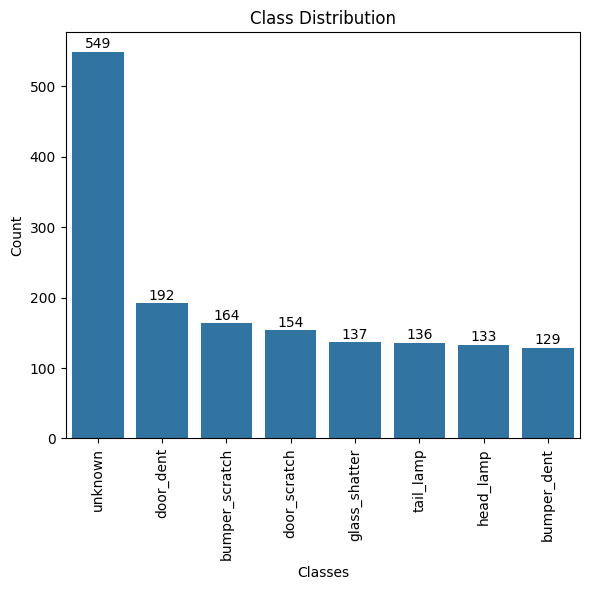

In [ ]:
classes_count = data['classes'].value_counts()

# Create the barplot
plt.figure(figsize=(6, 6))
ax = sns.barplot(x=classes_count.index, y=classes_count.values)

# Add count labels on top of each bar
for i, count in enumerate(classes_count.values):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=10)

# Labeling
plt.xlabel('Classes')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

In [ ]:
path = './CarDamage/'
def modify_image_path(x):
  return path + x

In [ ]:
data['image'] = data['image'].apply(modify_image_path)
data.head()

,image,classes
0,./CarDamage/image/0.jpeg,unknown
1,./CarDamage/image/1.jpeg,head_lamp
2,./CarDamage/image/2.jpeg,door_scratch
3,./CarDamage/image/3.jpeg,head_lamp
4,./CarDamage/image/4.jpeg,unknown


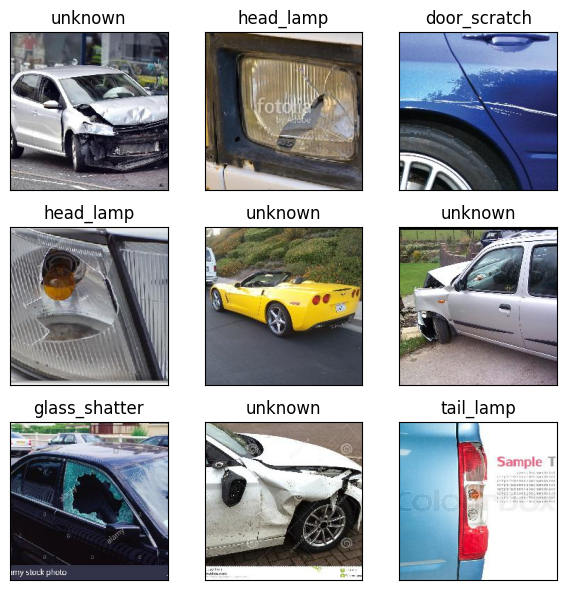

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(6, 6),  subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
  ax.imshow(plt.imread(data.image[i]))
  ax.set_title(data.classes[i])
plt.tight_layout()
plt.show()

## Data Preparation

#### Train-Test Split

In [ ]:
train_df, test_df = train_test_split(data, test_size=0.2)

In [ ]:
train_df.shape

(1275, 2)

In [ ]:
test_df.shape

(319, 2)

####  Data augmentation

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=10,
    zoom_range=0.2,
    brightness_range=[0.9,1.1],
    horizontal_flip=True,
    channel_shift_range=0.1,
    fill_mode='nearest',
    validation_split=0.2
)

test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_gen = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col = 'image',
    y_col = 'classes',
    target_size=IMG_SIZE,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED
)

val_gen = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col = 'image',
    y_col = 'classes',
    target_size=IMG_SIZE,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
    subset='validation'
)


Found 1275 validated image filenames belonging to 8 classes.
Found 255 validated image filenames belonging to 8 classes.


In [ ]:
test_gen = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col = 'image',
    y_col = 'classes',
    target_size=IMG_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 319 validated image filenames belonging to 8 classes.


In [ ]:
print(type(train_gen))

<class 'keras.src.legacy.preprocessing.image.DataFrameIterator'>


In [ ]:
images, labels = next(train_gen)

print("Images shape:", images.shape)
print("Labels shape:", labels.shape)

Images shape: (32, 224, 224, 3)
Labels shape: (32, 8)


In [ ]:
print("Total samples:", train_gen.samples)

Total samples: 1275


In [ ]:
images, labels = next(test_gen)
print("Images shape:", images.shape)
print("Labels shape:", labels.shape)

Images shape: (32, 224, 224, 3)
Labels shape: (32, 8)


#### Check data

In [ ]:
def check_one(data, label, id = None, actual = None, compare = False):
  # check one
  if id is None:
    id = np.random.randint(data.shape[0])
  im = data[id]
  plt.figure(figsize=(3, 3))
  plt.imshow(im)

  l_id = label[id]
  #if (compare) and (actual is not None) and (l_id != np.argmax(actual[id])):
  if (compare) and (actual is not None):
    a_id = np.argmax(actual[id])
    #plt.title('Class %d (%s) [\u2260 %d-%s]' % (l_id, classes[l_id], a_id, classes[a_id]))
    plt.title(f"True: Class {a_id} - {classes[a_id]}\nPredicted: Class {l_id} - {classes[l_id]}")
  else:
    plt.title('Class %d (%s)' % (l_id, classes[l_id]))
  plt.xticks([])
  plt.yticks([])
  plt.show()

In [ ]:
def check_ten(data, label, actual = None, compare = False):
  # check ten
  fig, ax = plt.subplots(2, 5, figsize = (16, 8))
  fig.subplots_adjust(left = 0.02, right = 0.98, top = 0.8, wspace = 0.2, hspace = 0.2)
  fig.suptitle('Check Data', fontsize = 12, fontweight = 'bold')

  plt.rcParams.update({'font.size': 10})

  ids = np.random.randint(data.shape[0], size = 10)
  r = 0
  c = 0
  for id in ids:
    im = data[id]

    # original image
    ax[r, c].imshow(im)
    l_id = label[id]
    #if (compare) and (actual is not None) and (l_id != np.argmax(actual[id])):
    if (compare) and (actual is not None):
      a_id = np.argmax(actual[id])
      #ax[r, c].set_title('Class %d (%s) [\u2260 %d-%s]' % (l_id, classes[l_id], a_id, classes[a_id]))
      ax[r, c].set_title(f"True: {classes[a_id]}\nPredicted: {classes[l_id]}")
    else:
      ax[r, c].set_title('Class %d (%s)' % (l_id, classes[l_id]))
    ax[r, c].set_xticks([])
    ax[r, c].set_yticks([])
    c += 1
    if c > 4:
      r += 1
      c = 0

  plt.show()

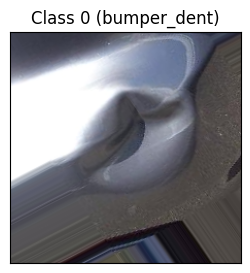

In [ ]:
images, labels = next(train_gen)
check_one(images, np.argmax(labels, axis=1))

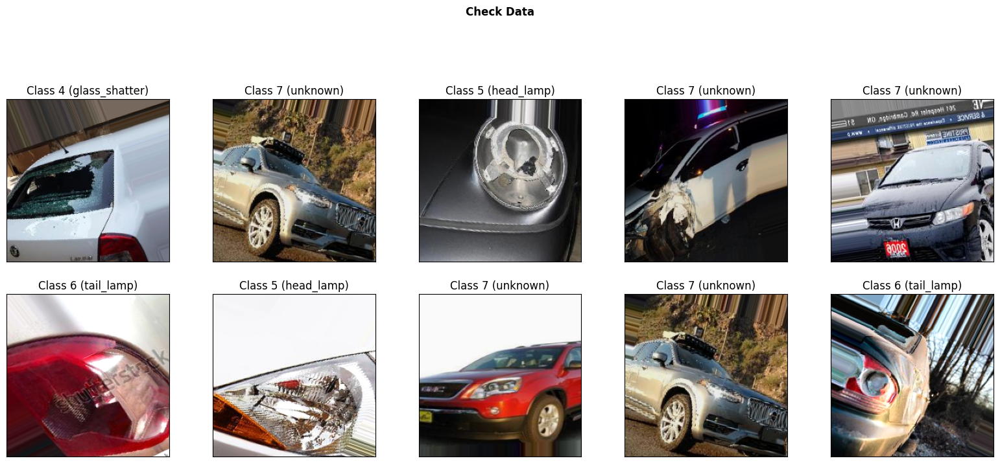

In [ ]:
check_ten(images, np.argmax(labels, axis=1))

In [ ]:
num_classes = len(labels[0])
print(labels[0])
print(num_classes)

[0. 0. 0. 0. 0. 1. 0. 0.]
8


## Model builders

In [ ]:
def build_mobilenetv2(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES, dropout_rate=0.2):
    base = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base.trainable = False  # freeze for initial training
    model = models.Sequential([
        base,
        layers.GlobalAveragePooling2D(),
        layers.Dropout(dropout_rate),
        layers.Dense(num_classes, activation='softmax')
    ])
    print(model.summary())
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
def build_vgg16(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES, dropout_rate=0.2):
    base = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base.trainable = False
    model = models.Sequential([
        base,
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(dropout_rate),
        layers.Dense(num_classes, activation='softmax')
    ])
    print(model.summary())
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
def build_custom_cnn(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES,
                       conv_dropout_rate=0.25, dense_dropout_rate=0.5):
    inputs = layers.Input(shape=input_shape)

    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.Conv2D(64, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Dropout(conv_dropout_rate)(x)

    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Dropout(conv_dropout_rate)(x)

    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Dropout(conv_dropout_rate)(x)

    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(dense_dropout_rate)(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(dense_dropout_rate)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    print(model.summary())
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

## Model Training, Evaluation & Prediction

In [ ]:
models_to_train = {
    "MobileNetV2_1": build_mobilenetv2(dropout_rate=0.2),
    "MobileNetV2_2": build_mobilenetv2(dropout_rate=0.3),
    "MobileNetV2_3": build_mobilenetv2(dropout_rate=0.5),
    "VGG-16_1"      : build_vgg16(dropout_rate=0.2),
    "VGG-16_2"      : build_vgg16(dropout_rate=0.3),
    "VGG-16_3"      : build_vgg16(dropout_rate=0.5),
    "Custom_CNN_1" : build_custom_cnn(conv_dropout_rate=0.2, dense_dropout_rate=0.2),
    "Custom_CNN_2" : build_custom_cnn(conv_dropout_rate=0.5, dense_dropout_rate=0.5),
    "Custom_CNN_3" : build_custom_cnn(conv_dropout_rate=0.25, dense_dropout_rate=0.5)
}

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 8)              │        10,248 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 10,248 (40.03 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

None


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │        10,248 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 10,248 (40.03 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

None


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 8)              │        10,248 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 10,248 (40.03 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

None
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,139,528 (80.64 MB)

 Trainable params: 6,424,840 (24.51 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

None


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,139,528 (80.64 MB)

 Trainable params: 6,424,840 (24.51 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

None


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,139,528 (80.64 MB)

 Trainable params: 6,424,840 (24.51 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

None


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 222, 222, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 111, 111, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 109, 109, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 54, 54, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 173056)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 512)            │    88,605,184 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 89,883,976 (342.88 MB)

 Trainable params: 89,883,976 (342.88 MB)

 Non-trainable params: 0 (0.00 B)

None


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 222, 222, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 111, 111, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 109, 109, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 54, 54, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 52, 52, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 173056)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │    88,605,184 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 89,883,976 (342.88 MB)

 Trainable params: 89,883,976 (342.88 MB)

 Non-trainable params: 0 (0.00 B)

None


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 222, 222, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 111, 111, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 109, 109, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 54, 54, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 52, 52, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 173056)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 512)            │    88,605,184 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 89,883,976 (342.88 MB)

 Trainable params: 89,883,976 (342.88 MB)

 Non-trainable params: 0 (0.00 B)

None



===== Training MobileNetV2_1 =====
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 34s 653ms/step - accuracy: 0.2784 - loss: 2.2273 - val_accuracy: 0.5569 - val_loss: 1.2747
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 24s 591ms/step - accuracy: 0.5611 - loss: 1.2672 - val_accuracy: 0.6824 - val_loss: 0.9245
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 22s 562ms/step - accuracy: 0.6548 - loss: 0.9931 - val_accuracy: 0.7294 - val_loss: 0.7954
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 23s 572ms/step - accuracy: 0.7130 - loss: 0.8562 - val_accuracy: 0.7569 - val_loss: 0.7312
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 23s 575ms/step - accuracy: 0.6847 - loss: 0.8732 - val_accuracy: 0.7765 - val_loss: 0.6636
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 24s 612ms/step - accuracy: 0.7199 - loss: 0.7917 - val_accuracy: 0.8235 - val_loss: 0.5983
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 23s 575ms/step - accuracy: 0.7453 - loss: 0.6951 - val_accuracy: 0.8039 - val_loss: 0.5540
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 23s 574ms/step 

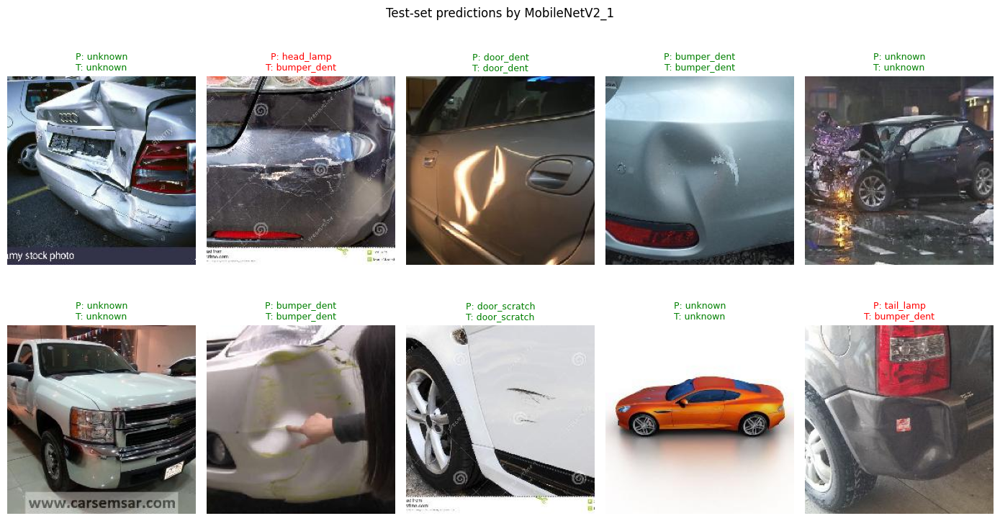


===== Training MobileNetV2_2 =====
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 656ms/step - accuracy: 0.3297 - loss: 2.1408 - val_accuracy: 0.5451 - val_loss: 1.2526
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 24s 593ms/step - accuracy: 0.5548 - loss: 1.3011 - val_accuracy: 0.7020 - val_loss: 0.9026
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 25s 636ms/step - accuracy: 0.6252 - loss: 1.0852 - val_accuracy: 0.7412 - val_loss: 0.8402
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 24s 595ms/step - accuracy: 0.6663 - loss: 0.9486 - val_accuracy: 0.8000 - val_loss: 0.6620
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 593ms/step - accuracy: 0.7113 - loss: 0.8492 - val_accuracy: 0.7961 - val_loss: 0.6688
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 596ms/step - accuracy: 0.7219 - loss: 0.8140 - val_accuracy: 0.7843 - val_loss: 0.6470
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 24s 597ms/step - accuracy: 0.7358 - loss: 0.7849 - val_accuracy: 0.8118 - val_loss: 0.5712
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 588ms/step 

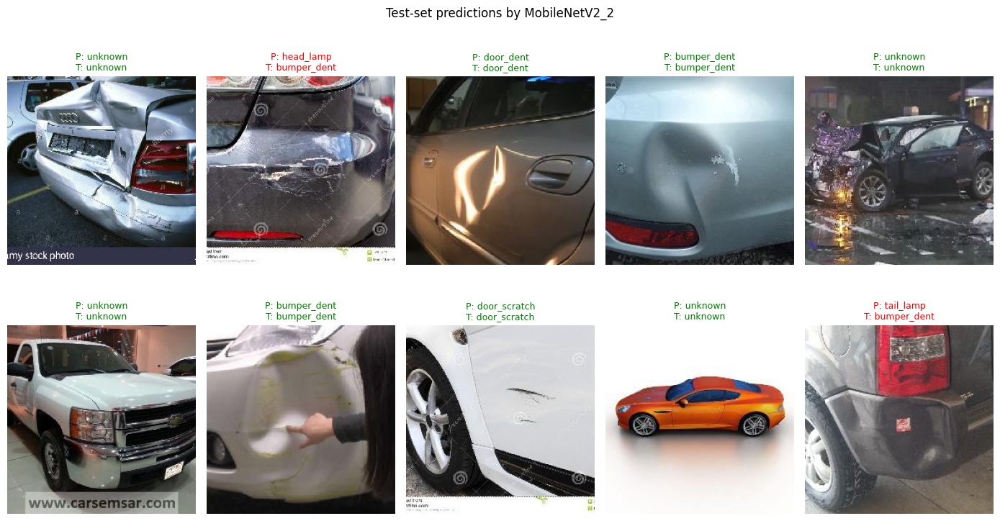


===== Training MobileNetV2_3 =====
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 33s 701ms/step - accuracy: 0.2488 - loss: 2.4107 - val_accuracy: 0.5412 - val_loss: 1.2359
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 25s 631ms/step - accuracy: 0.4628 - loss: 1.6466 - val_accuracy: 0.6745 - val_loss: 0.9739
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 622ms/step - accuracy: 0.5774 - loss: 1.2211 - val_accuracy: 0.7098 - val_loss: 0.9121
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 606ms/step - accuracy: 0.6147 - loss: 1.1421 - val_accuracy: 0.7255 - val_loss: 0.8045
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 610ms/step - accuracy: 0.6685 - loss: 1.0134 - val_accuracy: 0.8039 - val_loss: 0.7126
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 24s 605ms/step - accuracy: 0.6564 - loss: 1.0005 - val_accuracy: 0.7725 - val_loss: 0.7087
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 24s 606ms/step - accuracy: 0.6971 - loss: 0.9182 - val_accuracy: 0.7608 - val_loss: 0.6880
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 24s 606ms/step 

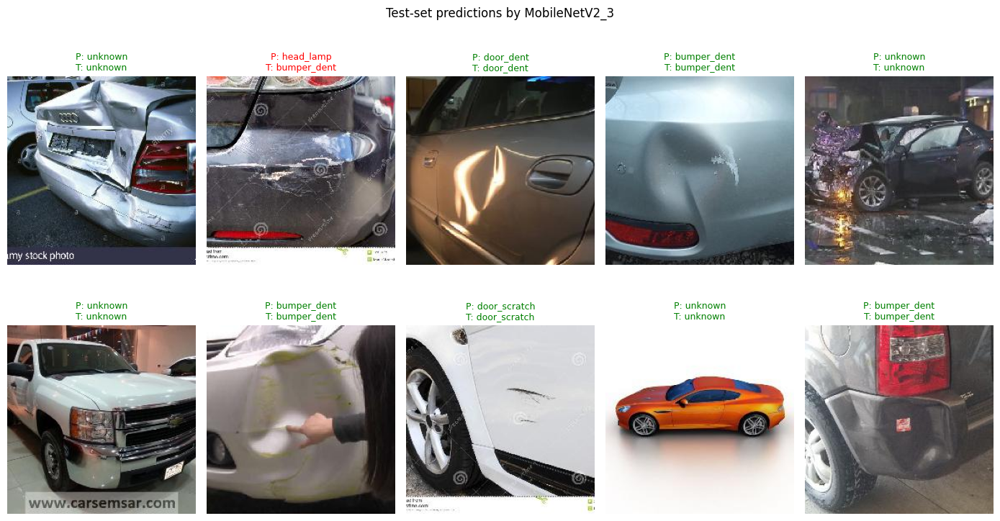


===== Training VGG-16_1 =====
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 31s 743ms/step - accuracy: 0.3426 - loss: 3.2862 - val_accuracy: 0.5961 - val_loss: 1.1832
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 28s 696ms/step - accuracy: 0.5760 - loss: 1.1904 - val_accuracy: 0.6784 - val_loss: 1.0194
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 713ms/step - accuracy: 0.6295 - loss: 1.0605 - val_accuracy: 0.6118 - val_loss: 1.0791
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 710ms/step - accuracy: 0.6442 - loss: 1.0759 - val_accuracy: 0.7373 - val_loss: 0.8712
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 691ms/step - accuracy: 0.6660 - loss: 0.9742 - val_accuracy: 0.7216 - val_loss: 0.8605
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 688ms/step - accuracy: 0.6726 - loss: 0.9372 - val_accuracy: 0.7725 - val_loss: 0.7258
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 698ms/step - accuracy: 0.7287 - loss: 0.8308 - val_accuracy: 0.7686 - val_loss: 0.6928
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 27s 688ms/step - acc

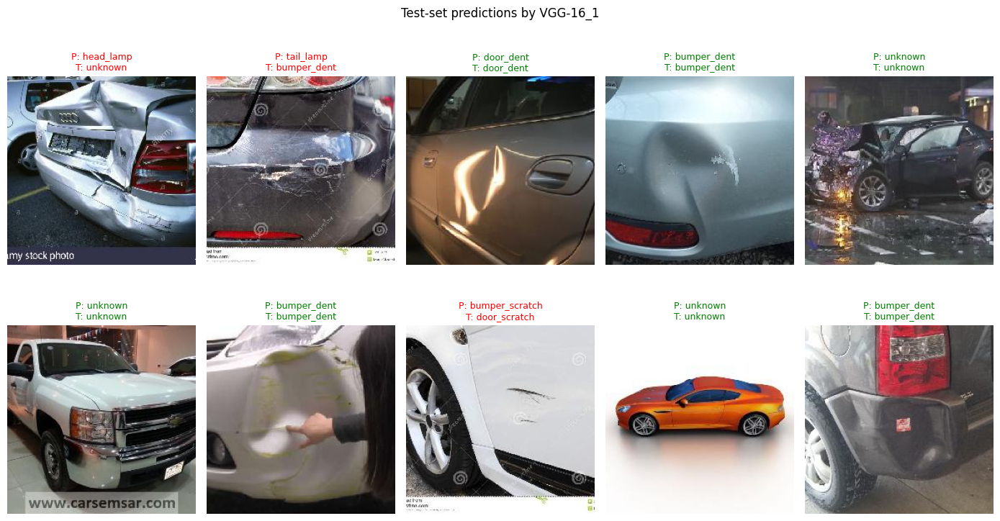


===== Training VGG-16_2 =====
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 31s 748ms/step - accuracy: 0.3013 - loss: 4.5882 - val_accuracy: 0.5333 - val_loss: 1.2680
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 29s 723ms/step - accuracy: 0.5227 - loss: 1.3256 - val_accuracy: 0.5412 - val_loss: 1.2216
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 29s 726ms/step - accuracy: 0.5392 - loss: 1.2562 - val_accuracy: 0.6667 - val_loss: 1.0580
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 696ms/step - accuracy: 0.6132 - loss: 1.1011 - val_accuracy: 0.6510 - val_loss: 1.0607
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 29s 725ms/step - accuracy: 0.6447 - loss: 1.0884 - val_accuracy: 0.7059 - val_loss: 0.9341
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 739ms/step - accuracy: 0.6077 - loss: 1.0959 - val_accuracy: 0.7412 - val_loss: 0.8704
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 39s 693ms/step - accuracy: 0.6362 - loss: 1.0419 - val_accuracy: 0.7373 - val_loss: 0.8110
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 29s 720ms/step - acc

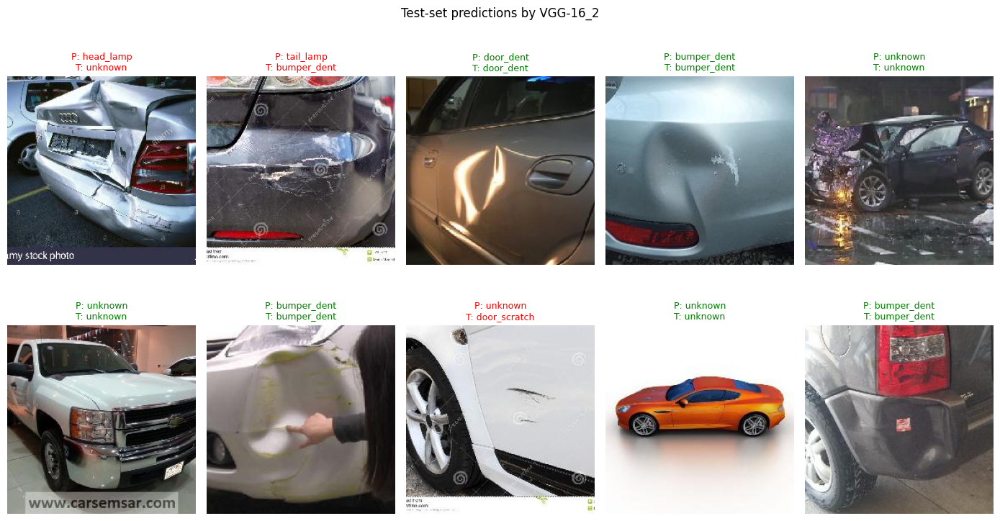


===== Training VGG-16_3 =====
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 30s 731ms/step - accuracy: 0.2984 - loss: 3.7053 - val_accuracy: 0.4353 - val_loss: 1.5076
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 699ms/step - accuracy: 0.4410 - loss: 1.5623 - val_accuracy: 0.4980 - val_loss: 1.3504
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 34s 856ms/step - accuracy: 0.4191 - loss: 1.5693 - val_accuracy: 0.5373 - val_loss: 1.3389
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 35s 709ms/step - accuracy: 0.4362 - loss: 1.4782 - val_accuracy: 0.5137 - val_loss: 1.2574
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 735ms/step - accuracy: 0.4809 - loss: 1.3507 - val_accuracy: 0.5843 - val_loss: 1.2677
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 713ms/step - accuracy: 0.4827 - loss: 1.3873 - val_accuracy: 0.5843 - val_loss: 1.1704
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 727ms/step - accuracy: 0.5067 - loss: 1.2891 - val_accuracy: 0.6000 - val_loss: 1.1804
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 723ms/step - acc

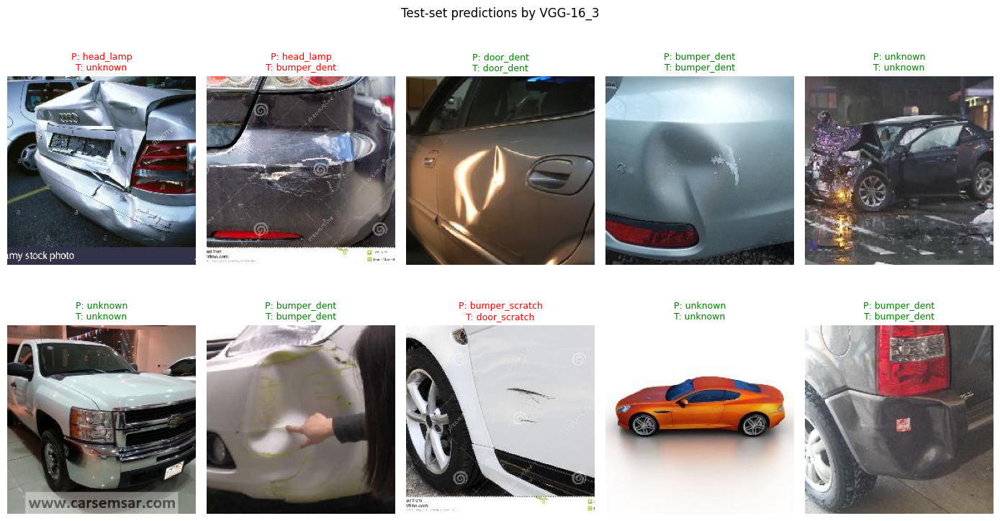


===== Training Custom_CNN_1 =====
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.2917 - loss: 2.8728 - val_accuracy: 0.3725 - val_loss: 1.8935
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.3625 - loss: 1.8905 - val_accuracy: 0.3725 - val_loss: 1.8322
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.3304 - loss: 1.8575 - val_accuracy: 0.3725 - val_loss: 1.8439
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.3568 - loss: 1.8241 - val_accuracy: 0.3725 - val_loss: 1.7760
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.3330 - loss: 1.8575 - val_accuracy: 0.4039 - val_loss: 1.7082
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.3569 - loss: 1.7522 - val_accuracy: 0.4078 - val_loss: 1.6350
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.3906 - loss: 1.6961 - val_accuracy: 0.4314 - val_loss: 1.6319
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.3894 - loss

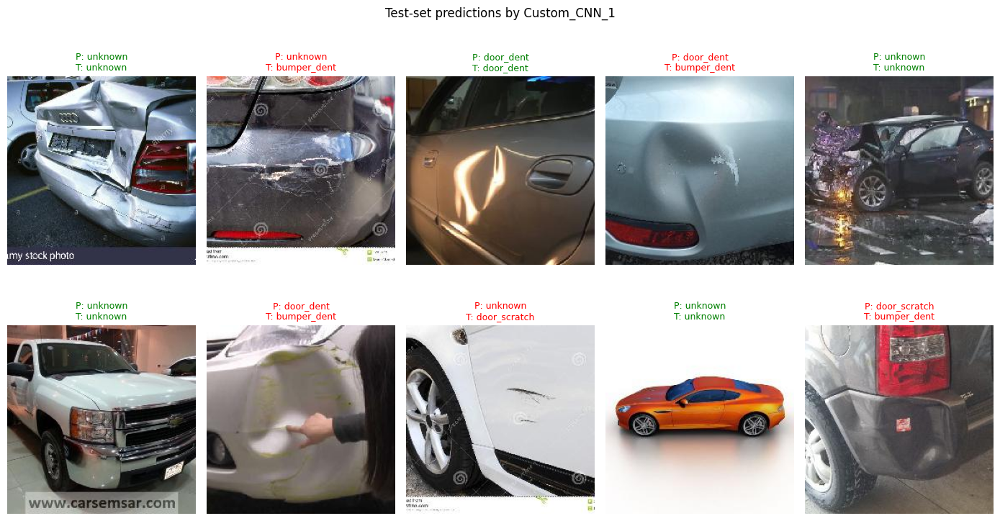


===== Training Custom_CNN_2 =====
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.2748 - loss: 4.5684 - val_accuracy: 0.3725 - val_loss: 1.8889
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.3119 - loss: 2.0073 - val_accuracy: 0.3725 - val_loss: 1.8796
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.3395 - loss: 1.9350 - val_accuracy: 0.3725 - val_loss: 1.8819
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.3315 - loss: 1.8766 - val_accuracy: 0.3725 - val_loss: 1.7634
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - accuracy: 0.3605 - loss: 1.8311 - val_accuracy: 0.3725 - val_loss: 1.7289
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.3347 - loss: 1.8296 - val_accuracy: 0.3725 - val_loss: 1.7334
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.3329 - loss: 1.7946 - val_accuracy: 0.4078 - val_loss: 1.8382
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - accuracy: 0.3548 - loss

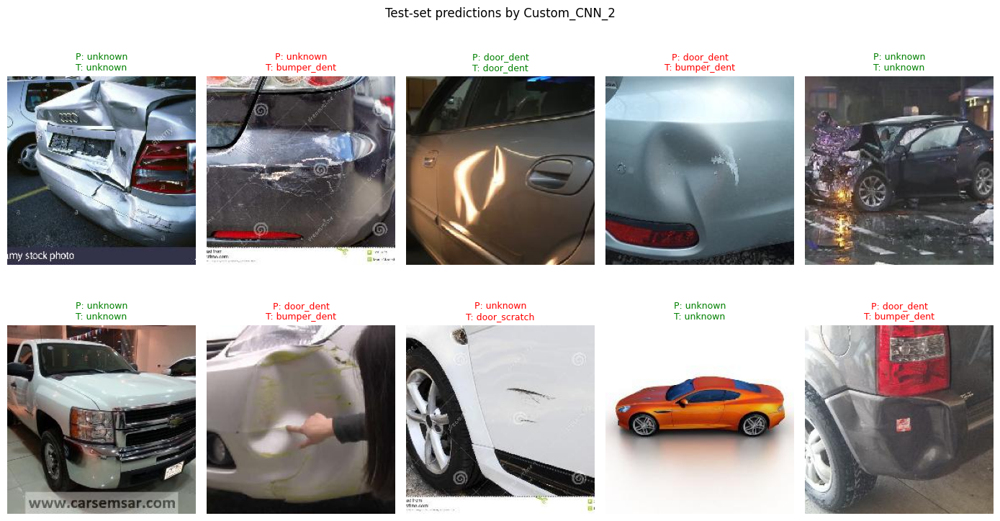


===== Training Custom_CNN_3 =====
Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.2662 - loss: 3.3282 - val_accuracy: 0.3725 - val_loss: 1.8740
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.3547 - loss: 1.9094 - val_accuracy: 0.3725 - val_loss: 1.7867
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.3322 - loss: 1.8869 - val_accuracy: 0.3725 - val_loss: 1.7557
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.3481 - loss: 1.8059 - val_accuracy: 0.3765 - val_loss: 1.7130
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.3688 - loss: 1.7559 - val_accuracy: 0.4000 - val_loss: 1.6911
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.3604 - loss: 1.8173 - val_accuracy: 0.3843 - val_loss: 1.6973
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.3952 - loss: 1.7224 - val_accuracy: 0.4275 - val_loss: 1.6093
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.3824 - loss

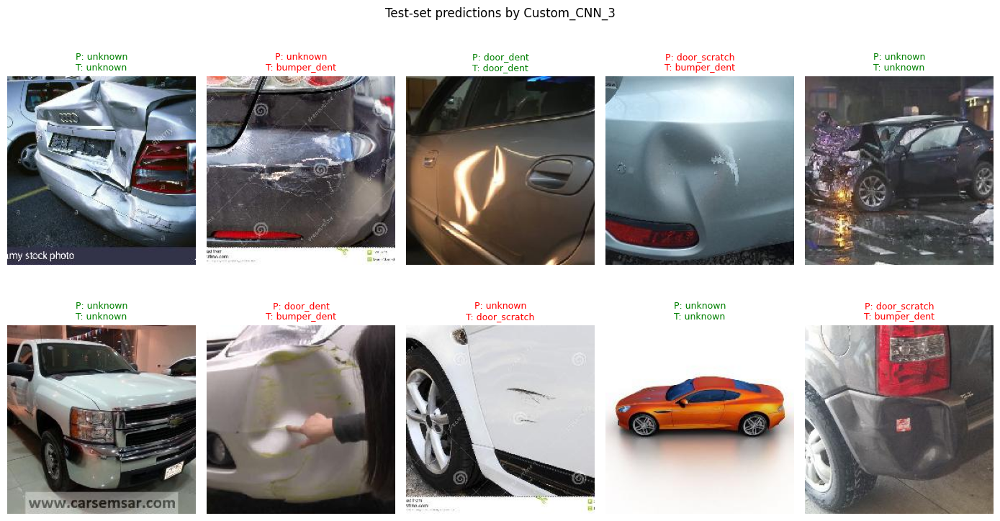

CPU times: user 1h 2min 21s, sys: 1min 44s, total: 1h 4min 6s
Wall time: 1h 57min 40s


In [36]:
%%time

history_dict = {}
summary_metrics = []  # will collect per‑model evaluation

for name, model in models_to_train.items():
    print(f"\n===== Training {name} =====")
    hist = model.fit(
        train_gen,
        epochs=EPOCHS,
        validation_data=val_gen,
        callbacks=[tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)],
    )

    print(f'Training accuracy:{hist.history["accuracy"][-1]:.2f} Validation accuracy:{hist.history["val_accuracy"][-1]:.2f}')

    # Save formats
    model.save_weights(f"{name}.weights.h5")
    model.save(f"{name}_model.keras")
    with open(f"{name}_model.json", "w", encoding="utf-8") as jf:
        jf.write(model.to_json())

    history_dict[name] = hist.history

    # -------- Evaluation on TEST set --------
    test_gen.reset()
    preds_test = model.predict(test_gen, verbose=0)
    y_pred_test = np.argmax(preds_test, axis=1)
    y_true_test = test_gen.classes

    acc = accuracy_score(y_true_test, y_pred_test)
    prec, rec, f1, _ = precision_recall_fscore_support(
        y_true_test, y_pred_test, average="weighted", zero_division=0
    )
    summary_metrics.append({
        "model": name,
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
    })

    labels = list(train_gen.class_indices.keys())
    print("TEST Confusion Matrix:\n", confusion_matrix(y_true_test, y_pred_test))
    print("TEST Classification Report:\n", classification_report(y_true_test, y_pred_test, target_names=labels))

    # Visualize 10 sample predictions from test set
    class_map = {v: k for k, v in train_gen.class_indices.items()}
    sample_x, sample_y = next(test_gen)
    sample_preds = model.predict(sample_x)
    sample_classes = np.argmax(sample_preds, axis=1)
    true_classes = np.argmax(sample_y, axis=1)

    plt.figure(figsize=(14, 8))
    for i in range(min(10, len(sample_x))):
        plt.subplot(2, 5, i + 1)
        plt.imshow(sample_x[i])
        plt.axis("off")
        pred_label = class_map[sample_classes[i]]
        true_label = class_map[true_classes[i]]
        color = "green" if pred_label == true_label else "red"
        plt.title(f"P: {pred_label}\nT: {true_label}", color=color, fontsize=9)
    plt.suptitle(f"Test‑set predictions by {name}")
    plt.tight_layout()
    plt.show()


## Visualization of Training Curves

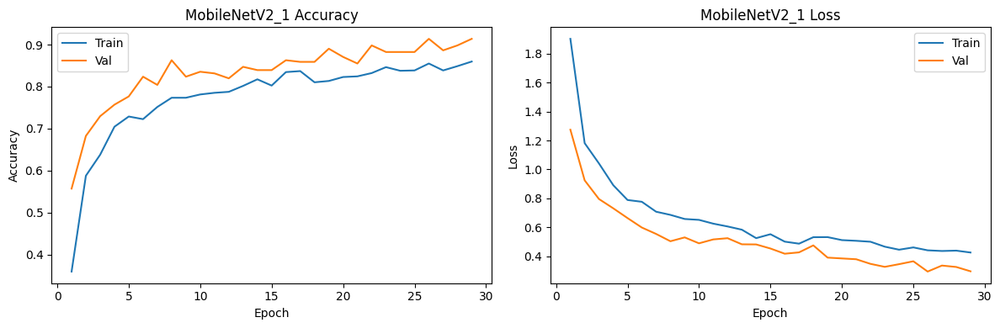

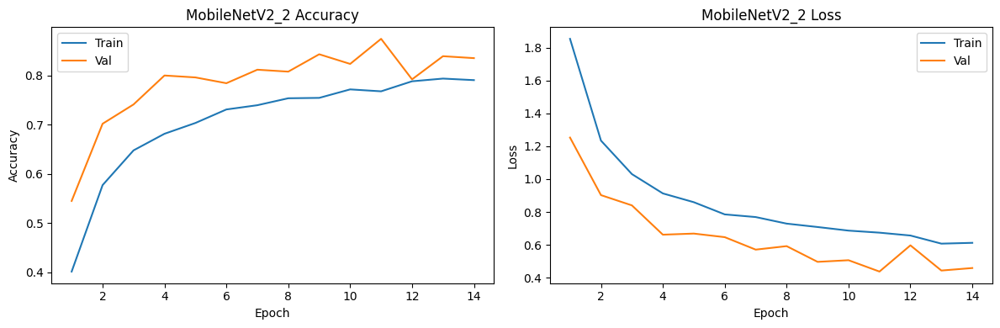

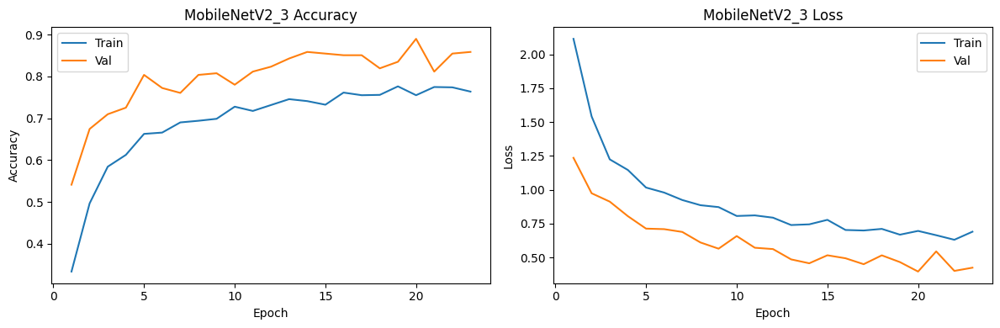

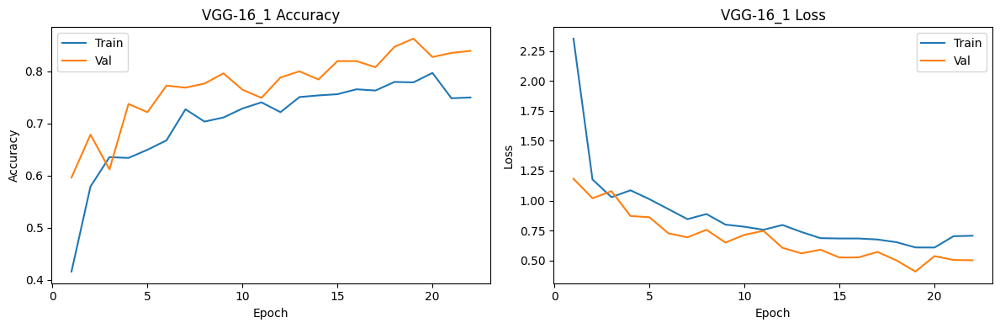

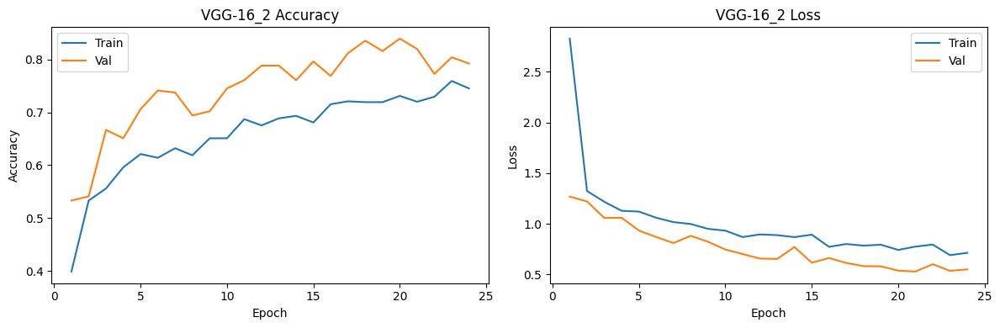

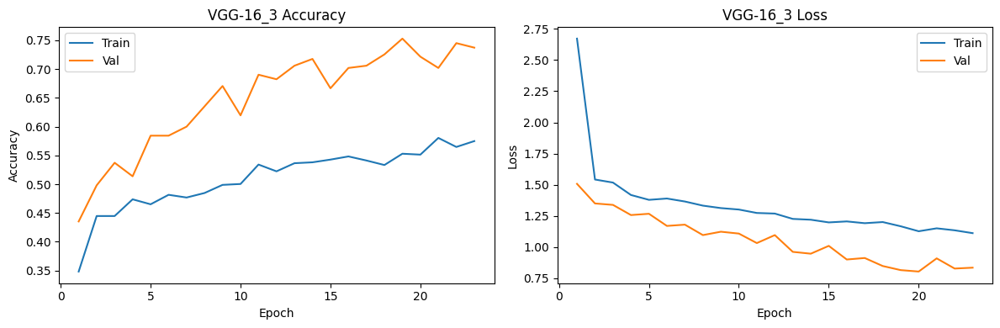

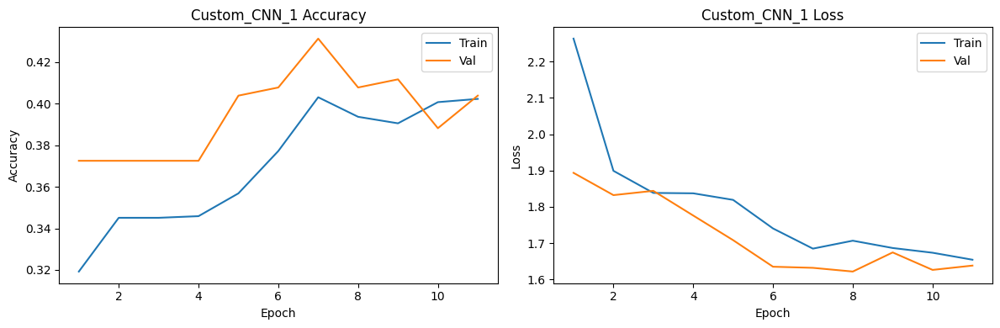

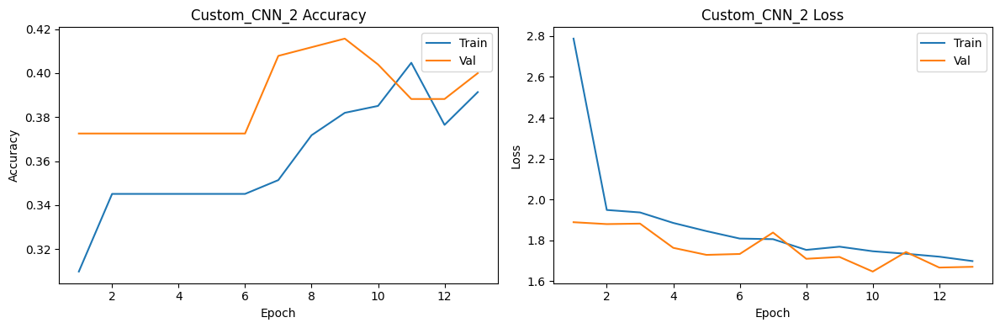

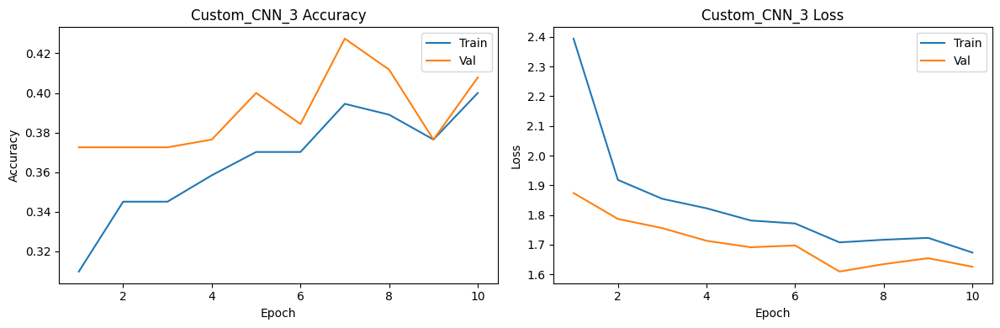

In [37]:
#  Visualization of training curves
def plot_history(histories):
    for name, history in histories.items():
        epochs_range = range(1, len(history["accuracy"]) + 1)
        #epochs_range = range(1, 41)
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(epochs_range, history["accuracy"], label="Train")
        plt.plot(epochs_range, history["val_accuracy"], label="Val")
        plt.title(f"{name} Accuracy")
        plt.xlabel("Epoch"); plt.ylabel("Accuracy"); plt.legend()
        plt.subplot(1, 2, 2)
        plt.plot(epochs_range, history["loss"], label="Train")
        plt.plot(epochs_range, history["val_loss"], label="Val")
        plt.title(f"{name} Loss")
        plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend()
        plt.tight_layout(); plt.show()

plot_history(history_dict)

## Summary of Model Metrics


Test‑set summary metrics (ImageSize: 224):
            model  accuracy  precision    recall        f1
0  MobileNetV2_1  0.780564   0.783696  0.780564  0.777410
1  MobileNetV2_2  0.783699   0.781330  0.783699  0.778049
2  MobileNetV2_3  0.789969   0.790529  0.789969  0.784744
3       VGG-16_1  0.730408   0.742531  0.730408  0.728402
4       VGG-16_2  0.736677   0.756575  0.736677  0.728331
5       VGG-16_3  0.645768   0.656202  0.645768  0.615236
6   Custom_CNN_1  0.398119   0.234683  0.398119  0.281002
7   Custom_CNN_2  0.385580   0.210999  0.385580  0.251762
8   Custom_CNN_3  0.420063   0.232549  0.420063  0.298757


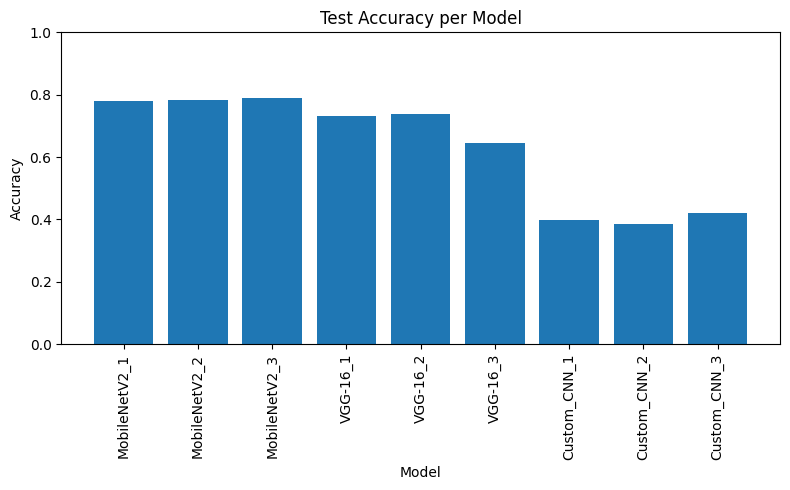


All done — models saved and evaluation summary complete!


In [38]:
#  Summary bar‑chart of model metrics
summary_df = pd.DataFrame(summary_metrics)
print("\nTest‑set summary metrics (ImageSize: 224):\n", summary_df)

# Bar chart of accuracy
plt.figure(figsize=(8, 5))
plt.bar(summary_df["model"], summary_df["accuracy"])
plt.title("Test Accuracy per Model"); plt.ylabel("Accuracy"); plt.ylim(0, 1)
plt.xticks(rotation=90)
plt.xlabel("Model"); plt.tight_layout(); plt.show()

print("\nAll done — models saved and evaluation summary complete!")

## Best Model

In [39]:
# Find best model by accuracy
best_model_info = max(summary_metrics, key=lambda x: x['accuracy'])
best_model_name = best_model_info['model']
print(f"Best model is {best_model_name} with Test Accuracy {best_model_info['accuracy']:.4f}")

# Get the corresponding trained model
best_model = models_to_train[best_model_name]

# Save the model weights
best_model.save_weights("best_model.weights.h5")

# Save the full model
best_model.save("best_model.keras")

# Save the model architecture (JSON)
with open("best_model.json", "w", encoding="utf-8") as jf:
    jf.write(best_model.to_json())

print("Best model and its components saved: best_model.weights.h5, best_model.keras, and best_model.json")

Best model is MobileNetV2_3 with Test Accuracy 0.7900
Best model and its components saved: best_model.weights.h5, best_model.keras, and best_model.json


## Model Deployment

The best model is deployed to Streamlit

Files have been uploaded to my Github:
- requirements.txt
- runtime.txt
- .streamlit/ (folder containing config.toml)
- app.py
- best_model.keras
- best_model.weights.h5
- best_model.json

Web App URL is https://car-damage-detect.streamlit.app



---



---



> > > > > > > > > © 2025 Institute of Data


---



---



